# What kind of doggo is that? Classifying Dog Breeds using Convolutional Neural Networks

## Task 1: Introduction and Exploratory Data Analysis

In this task, we will talk about our aim, as well as very quickly look at some samples from our dataset.

Our dataset is sourced originally from the [Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/), which comprises 37 classes, each class containing roughly 200 images of a certain breed of pet (it includes both dogs and cats).

We want to build a quick, efficient model to predict a subset of these breeds. We use a subset, because a model designed to predict all 37 classes of the dataset is expensive in terms of resources and time, and as such, a basic version that can be trained on just about any modern computer is significantly more appealing. By the last task, you might be surprised at just how good a model we can get!

## Prerequisites
- Intermediate-level Python knowledge
- Basic understanding of machine learning and neural networks (what is a training-validation data split, etc.)

## Project Outline
- **Task 1** Introduction and Exploratory Data Analysis (you are here)
- **Task 2** Convolutional Neural Network quickstart guide
- **Task 3** Dataset (image) preprocessing
- **Task 4** Building a model pipeline
- **Task 5** Designing and evaluating a basic Convolutional Neural Network
- **Task 6** Fine-tuning a state-of-the-art model for our usecase

## What we will build

![image](demo.png)

In [1]:
import matplotlib
import os
import shutil
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.style.use('ggplot')

import numpy as np
import glob

import random
random.seed(8)

In [2]:
desired_breeds = [
#     'abyssinian',
    'american_bulldog',
#     'american_pit_bull_terrier',
#     'basset_hound',
#     'beagle',
#     'bengal',
#     'birman',
#     'bombay',
    'boxer',
#     'british_shorthair',
#     'chihuahua',
#     'egyptian_mau',
    'english_cocker_spaniel',
#     'english_setter',
#     'german_shorthaired',
#     'great_pyrenees',
#     'havanese',
#     'japanese_chin',
#     'keeshond',
#     'leonberger',
#     'maine_coon',
#     'miniature_pinscher',
#     'newfoundland',
#     'persian',
#     'pomeranian',
#     'pug',
#     'ragdoll',
#     'russian_blue',
#     'saint_bernard',
    'samoyed',
    'scottish_terrier',
#     'shiba_inu',
#     'siamese',
#     'sphynx',
    'staffordshire_bull_terrier',
#     'wheaten_terrier',
#     'yorkshire_terrier'
]

In [9]:
glob.glob('images/*')[:5]

['images/Egyptian_Mau_167.jpg',
 'images/pug_52.jpg',
 'images/basset_hound_112.jpg',
 'images/Siamese_193.jpg',
 'images/shiba_inu_122.jpg']

In [3]:
images = glob.glob('images/*.jpg')
breeds = np.unique(['_'.join(x.split('_')[:-1]).split('/')[-1].lower() for x in images]).tolist()
breeds

['abyssinian',
 'american_bulldog',
 'american_pit_bull_terrier',
 'basset_hound',
 'beagle',
 'bengal',
 'birman',
 'bombay',
 'boxer',
 'british_shorthair',
 'chihuahua',
 'egyptian_mau',
 'english_cocker_spaniel',
 'english_setter',
 'german_shorthaired',
 'great_pyrenees',
 'havanese',
 'japanese_chin',
 'keeshond',
 'leonberger',
 'maine_coon',
 'miniature_pinscher',
 'newfoundland',
 'persian',
 'pomeranian',
 'pug',
 'ragdoll',
 'russian_blue',
 'saint_bernard',
 'samoyed',
 'scottish_terrier',
 'shiba_inu',
 'siamese',
 'sphynx',
 'staffordshire_bull_terrier',
 'wheaten_terrier',
 'yorkshire_terrier']

In [10]:
if os.path.isdir('Data'):
    shutil.rmtree('Data')
    
os.mkdir('Data')

for breed in desired_breeds:
    dest = f'Data/{breed}'
    os.mkdir(dest)
    
    files = [x for x in images if breed in x.lower()]
    for file in files:
        shutil.copy2(file, f'Data/{breed}/')

In [11]:
glob.glob('Data/*')

['Data/american_bulldog',
 'Data/english_cocker_spaniel',
 'Data/staffordshire_bull_terrier',
 'Data/samoyed',
 'Data/scottish_terrier',
 'Data/boxer']

In [12]:
breeds = [x.split('/')[-1] for x in glob.glob('Data/*')]
breeds

['american_bulldog',
 'english_cocker_spaniel',
 'staffordshire_bull_terrier',
 'samoyed',
 'scottish_terrier',
 'boxer']

In [13]:
for breed in breeds:
    images = glob.glob(f'Data/{breed}/*.jpg')
    print(f'{breed}\n{len(images)} samples')
    print('---')

american_bulldog
200 samples
---
english_cocker_spaniel
200 samples
---
staffordshire_bull_terrier
191 samples
---
samoyed
200 samples
---
scottish_terrier
199 samples
---
boxer
200 samples
---


In [14]:
num_samples = 3
fig, axes = plt.subplots(len(breeds), num_samples, figsize=(20,50))

for ix, breed in enumerate(breeds):
    images = glob.glob(f'Data/{breed}/*.jpg')
    images = np.random.choice(images, size=num_samples, replace=False)
    
    for ixx, image in enumerate(images):
        img = mpimg.imread(image)
        axes[ix, ixx].imshow(img)
        axes[ix, ixx].grid(None)
        axes[ix, ixx].axis('off')
        axes[ix, ixx].set_title(f'{breed} #{ixx+1}')
        
plt.tight_layout()



## Task 2: Convolutional Network background

In this task, we will very briefly go over the theory behind convolutional networks, and we will cover why they are powerful. We will also very simply show how they are implemented in TensorFlow.

[Convolutional theory reference guide](https://arxiv.org/pdf/1603.07285.pdf)

In [15]:
import tensorflow as tf

In [16]:
# 4 images of 28*28*3
input_shape = (4, 28, 28, 3)
x = tf.random.normal(input_shape)

2022-01-12 12:34:13.439327: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [17]:
#tf.keras.layers.Conv2D?
tf.keras.layers.MaxPool2D?

In [20]:
y = tf.keras.layers.Conv2D(
    filters=64,
    kernel_size=3,
    padding='same'
)(x)
y.shape

TensorShape([4, 28, 28, 64])

In [15]:
z = tf.keras.layers.MaxPool2D(
    pool_size=4
)(y)
z.shape

TensorShape([4, 7, 7, 64])



## Task 3: Dataset Preprocessing

In this task, we will highlight some fundamentals behind machine learning models, and start using some common approaches to preprocess our data such that it can plug into a model pipeline quite easily.

In [21]:
import tensorflow as tf
import glob

import matplotlib
%matplotlib inline
# %config InlineBackend.figure_format = 'svg'
matplotlib.rcParams['figure.dpi'] = 300
import matplotlib.pyplot as plt
plt.style.use('ggplot')

In [24]:
filenames = glob.glob('Data/*/*.jpg')

In [27]:
labels = [x.split('/')[1] for x in filenames]

In [28]:
print(filenames[:3])
print(labels[:3])

['Data/american_bulldog/american_bulldog_196.jpg', 'Data/american_bulldog/american_bulldog_182.jpg', 'Data/american_bulldog/american_bulldog_141.jpg']
['american_bulldog', 'american_bulldog', 'american_bulldog']


In [29]:
#normalize image features
def reshape_rescale_image(image, height=96, width=96):
    #make image float
    #RGB image is usually 0-255, /255 to make it between 0-1
    image = tf.cast(image, tf.float32)/255.
    #make images the same shape with padding method
    image = tf.image.resize_with_pad(
        image, target_height=height, target_width=width)
    return image

def parse_image(file_path):
    label = tf.strings.split(file_path, os.sep)[-2]
    image = tf.io.decode_image(tf.io.read_file(file_path), channels=3)
    image.set_shape([None, None, 3])
    return reshape_rescale_image(image)

In [30]:
def plot_image(image, title, ax):
    ax.imshow(image)
    ax.set_title(title)
    ax.grid(False)

def compare(original, processed):
    fig, axes = plt.subplots(1, 7, figsize=(12, 8))

    ax = axes.ravel()[0]
    plot_image(original, 'Original', ax)
    
    ax = axes.ravel()[1]
    plot_image(processed, 'Processed', ax)
    
    
    image_contrast = tf.keras.layers.experimental.preprocessing.RandomContrast(
    0.9)(processed[None, :], training=True)
    
    image_flip = tf.keras.layers.experimental.preprocessing.RandomFlip(
    'horizontal')(processed[None, :], training=True)
    
    image_rotate = tf.keras.layers.experimental.preprocessing.RandomRotation(
    0.2)(processed[None, :], training=True)
    
    image_dropout = tf.keras.layers.Dropout(0.3)(processed[None, :], training=True)
    
    # make all of the above on one image
    full = tf.keras.layers.experimental.preprocessing.RandomContrast(
    0.9)(processed[None, :], training=True)
    
    full = tf.keras.layers.experimental.preprocessing.RandomFlip(
    'horizontal')(full, training=True)
    
    full = tf.keras.layers.experimental.preprocessing.RandomRotation(
    0.2)(full, training=True)
    
    full = tf.keras.layers.Dropout(0.3)(full, training=True)
    
    ax = axes.ravel()[2]
    plot_image(tf.clip_by_value(tf.squeeze(image_contrast), 0, 1), 'Random contrast', ax)
    
    ax = axes.ravel()[3]
    plot_image(tf.clip_by_value(tf.squeeze(image_flip), 0, 1), 'Random flip', ax)
    
    ax = axes.ravel()[4]
    plot_image(tf.clip_by_value(tf.squeeze(image_rotate), 0, 1), 'Random rotation', ax)
    
    ax = axes.ravel()[5]
    plot_image(tf.clip_by_value(tf.squeeze(image_dropout), 0, 1), 'Dropout', ax)

    
    ax = axes.ravel()[6]
    plot_image(tf.clip_by_value(tf.squeeze(full), 0, 1), 'Full preprocessing', ax)

    
    plt.tight_layout()

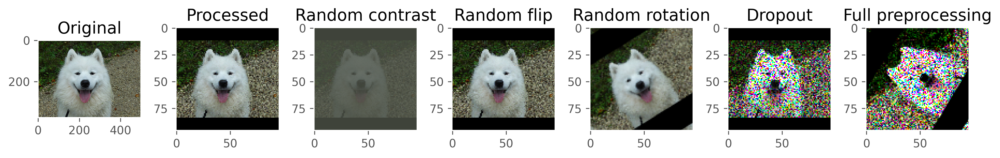

In [31]:
sample_path = 'Data/samoyed/samoyed_103.jpg'

original = tf.io.decode_image(tf.io.read_file(sample_path), channels=3)
processed = parse_image(sample_path)
compare(original, processed)



## Task 4: Model Pipeline

In this task, we will show how to build an efficient model input pipeline based on our preprocessing steps from the previous task.

In [32]:
from sklearn.model_selection import train_test_split

In [33]:
filenames = glob.glob('Data/*/*.jpg')

In [34]:
labels = [x.split('/')[1] for x in filenames]

In [35]:
breeds = np.unique(labels)
breeds_to_label = {breed: ix for ix, breed in enumerate(breeds)}
breeds_to_label

{'american_bulldog': 0,
 'boxer': 1,
 'english_cocker_spaniel': 2,
 'samoyed': 3,
 'scottish_terrier': 4,
 'staffordshire_bull_terrier': 5}

In [36]:
filenames_train, filenames_val, y_train, y_val = train_test_split(
    filenames, labels, stratify=labels, random_state=8
)

In [37]:
table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(
        keys=tf.constant(list(breeds_to_label.keys())),
        values=tf.constant(list(breeds_to_label.values()))
    ),
    default_value=tf.constant(-1)
)

input_tensor = tf.constant(['boxer', 'samoyed'], dtype=tf.string)
table.lookup(input_tensor)

<tf.Tensor: shape=(2,), dtype=int32, numpy=array([1, 3], dtype=int32)>

In [38]:
def reshape_rescale_image(image, height=96, width=96):
    image = tf.cast(image, tf.float32)/255.
    image = tf.image.resize_with_pad(image, target_height=height, target_width=width)
    return image

def parse_image(file_path):
    label = tf.strings.split(file_path, os.sep)[-2]
    image = tf.io.decode_image(tf.io.read_file(file_path), channels=3)
    image.set_shape([None, None, 3])
    return reshape_rescale_image(image), table.lookup(label)

In [49]:
dataset_train = tf.data.Dataset.list_files(filenames_train)
dataset_train = dataset_train.map(
    parse_image).cache('train.cache').shuffle(8).batch(32).prefetch(buffer_size=100)

#prefetch data for better speed 
dataset_val = tf.data.Dataset.list_files(filenames_val)
dataset_val = dataset_val.map(
    parse_image).batch(32).prefetch(buffer_size=100)


In [50]:
num_classes = len(breeds)

model = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.Dropout(0.3)
])


In [51]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']    
)


## Task 5: Basic Convolutional Neural Network

In this task, we will implement our very own model to try and predict these dog breeds accurately!

In [42]:
import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from helpers import plot_cm

In [52]:
dataset_train = tf.data.Dataset.list_files(filenames_train)
dataset_train = dataset_train.map(parse_image).cache('dataset_train.cache').shuffle(8).batch(8).prefetch(buffer_size=400)
#reduced batch size for limited RAM
dataset_val = tf.data.Dataset.list_files(filenames_val)
dataset_val = dataset_val.map(parse_image).batch(8).prefetch(buffer_size=100)

In [53]:
num_classes = len(breeds)

model = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(128, 3, padding='same', activation='relu'),
    tf.keras.layers.MaxPooling2D(2),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(num_classes)
])

In [54]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']    
)

In [55]:
#if val_loss stop improving, stop training 
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    mode='auto',
    restore_best_weights=True #sort of picking the best epoch
)

epochs = 20
history = model.fit(
    dataset_train,
    validation_data=dataset_val,
    epochs=epochs,
    callbacks=[early_stopping_callback]
)

Epoch 1/20
 70/112 [=================>............] - ETA: 3s - loss: 1.7918 - accuracy: 0.2000

2022-01-13 11:24:44.957370: W tensorflow/core/kernels/data/cache_dataset_ops.cc:233] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


112/112 [==============================] - 13s 109ms/step - loss: 1.7626 - accuracy: 0.2231 - val_loss: 1.7288 - val_accuracy: 0.2785
Epoch 2/20
112/112 [==============================] - 13s 112ms/step - loss: 1.6768 - accuracy: 0.2769 - val_loss: 1.6925 - val_accuracy: 0.3221
Epoch 3/20
112/112 [==============================] - 12s 111ms/step - loss: 1.6357 - accuracy: 0.3083 - val_loss: 1.6397 - val_accuracy: 0.3087
Epoch 4/20
112/112 [==============================] - 12s 111ms/step - loss: 1.5797 - accuracy: 0.3352 - val_loss: 1.6138 - val_accuracy: 0.3322
Epoch 5/20
112/112 [==============================] - 13s 112ms/step - loss: 1.5563 - accuracy: 0.3184 - val_loss: 1.5929 - val_accuracy: 0.3624
Epoch 6/20
112/112 [==============================] - 12s 110ms/step - loss: 1.5154 - accuracy: 0.3643 - val_loss: 1.5648 - val_accuracy: 0.4094
Epoch 7/20
112/112 [==============================] - 13s 118ms/step - loss: 1.4900 - accuracy: 0.3823 - val_loss: 1.5314 - val_accuracy: 0.4

In [56]:
preds, true = [], []
for x, y in dataset_val:
    true.extend([breeds[x] for x in y.numpy().tolist()])
    predictions = np.argmax(model.predict(x).tolist(), axis=1)
    preds.extend([breeds[x] for x in predictions])

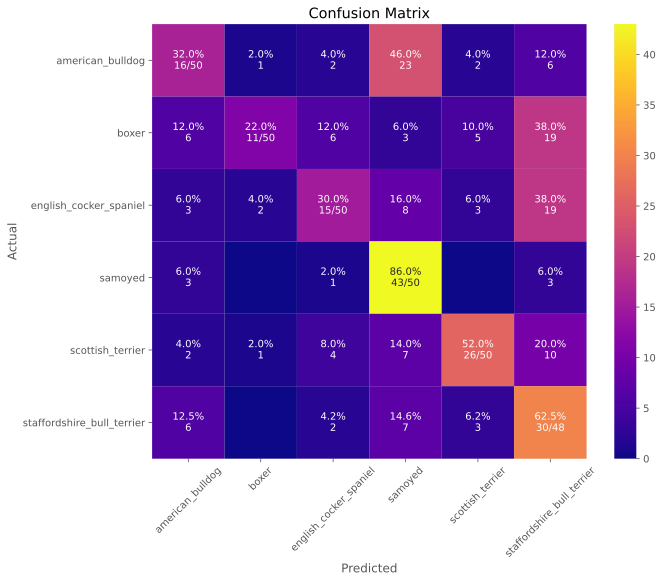

In [57]:
plot_cm(true, preds)


## Task 6: Fine-tuning EfficientNet for our Dog Breed Classifier

In this task, we will use well-known architecture and see how it compares to our basic implementation. The pre-designed architecture we will use is that of [EfficientNet](https://arxiv.org/abs/1905.11946). 

Since by its very name, EfficientNet, is designed to be an efficient convolutional network, we hope it will also perform well on minimal hardware resources, such as any machine you might have at home, or even this Linux instance. We will use a version that is pretrained on [ImageNet](http://www.image-net.org), which we know includes images of dogs in its training data.

In [58]:
import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np
import glob
import os

from helpers import plot_cm

In [59]:
def reshape_rescale_image(image, height=96, width=96):
#     image = tf.cast(image, tf.float32)/255.  Removed because ImageNet has this built-in
    image = tf.image.resize_with_pad(image, target_height=height, target_width=width)
    return image

def parse_image(file_path):
    label = tf.strings.split(file_path, os.sep)[-2]
    image = tf.io.decode_image(tf.io.read_file(file_path), channels=3)
    image.set_shape([None, None, 3])
    return reshape_rescale_image(image), table.lookup(label)

In [60]:
filenames = glob.glob('Data/*/*.jpg')
labels = [x.split('/')[1] for x in filenames]

breeds = np.unique(labels)
breeds_to_label = {breed: ix for ix, breed in enumerate(breeds)}
breeds_to_label

filenames_train, filenames_val, y_train, y_val = train_test_split(filenames, labels, stratify=labels, random_state=8)

# build a lookup table
table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(
        keys=tf.constant(breeds.tolist()),
        values=tf.constant(np.arange(len(breeds)).tolist()),
    ),
    default_value=tf.constant(-1)
)

# now let us do a lookup
input_tensor = tf.constant(['beagle'], dtype=tf.string)
table.lookup(input_tensor)

# now let us do a lookup
input_tensor = tf.constant(['beagle'], dtype=tf.string)
table.lookup(input_tensor)

<tf.Tensor: shape=(1,), dtype=int32, numpy=array([-1], dtype=int32)>

In [83]:
dataset_train = tf.data.Dataset.list_files(filenames_train)
dataset_train = dataset_train.map(parse_image).cache('train_efficientnet.cache').shuffle(8).batch(32).prefetch(buffer_size=100)

dataset_val = tf.data.Dataset.list_files(filenames_val)
dataset_val = dataset_val.map(parse_image).batch(32).prefetch(buffer_size=100)

In [64]:
import ssl

ssl._create_default_https_context = ssl._create_unverified_context

In [84]:
efficientnet_model = tf.keras.applications.efficientnet.EfficientNetB0(
    input_shape=[96, 96, 3],
    include_top=False,#the last layer of the model is not needed for finetuning
    weights='imagenet'
)

In [85]:
#freeze the weights
efficientnet_model.trainable = False

In [86]:
efficientnet_model = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.2),
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.Dropout(0.2),
    efficientnet_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512),
    tf.keras.layers.Dense(len(breeds))
])

In [87]:
efficientnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [88]:
es_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True
)
epochs = 40
efficientnet_model.fit(
    dataset_train,
    validation_data=dataset_val,
    epochs=epochs,
    callbacks=[es_callback]
)

Epoch 1/40
27/28 [===========================>..] - ETA: 0s - loss: 1.8397 - accuracy: 0.3183

2022-01-14 17:32:48.255644: W tensorflow/core/kernels/data/cache_dataset_ops.cc:233] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


28/28 [==============================] - 13s 281ms/step - loss: 1.8262 - accuracy: 0.3240 - val_loss: 1.2745 - val_accuracy: 0.5302
Epoch 2/40
28/28 [==============================] - 6s 230ms/step - loss: 1.5102 - accuracy: 0.4137 - val_loss: 1.1819 - val_accuracy: 0.5940
Epoch 3/40
28/28 [==============================] - 7s 241ms/step - loss: 1.5071 - accuracy: 0.4350 - val_loss: 1.2200 - val_accuracy: 0.5872
Epoch 4/40
28/28 [==============================] - 7s 239ms/step - loss: 1.4188 - accuracy: 0.4765 - val_loss: 1.1447 - val_accuracy: 0.5973
Epoch 5/40
28/28 [==============================] - 7s 236ms/step - loss: 1.2926 - accuracy: 0.5067 - val_loss: 1.1360 - val_accuracy: 0.6376
Epoch 6/40
28/28 [==============================] - 7s 242ms/step - loss: 1.2409 - accuracy: 0.5202 - val_loss: 1.0823 - val_accuracy: 0.6208
Epoch 7/40
28/28 [==============================] - 7s 238ms/step - loss: 1.2290 - accuracy: 0.5247 - val_loss: 1.1950 - val_accuracy: 0.6208
Epoch 8/40
28/28

In [89]:
preds, true = [], []
for x, y in dataset_val:
    true.extend([breeds[x] for x in y.numpy().tolist()])
    predictions = np.argmax(efficientnet_model.predict(x).tolist(), axis=1)
    preds.extend([breeds[x] for x in predictions])

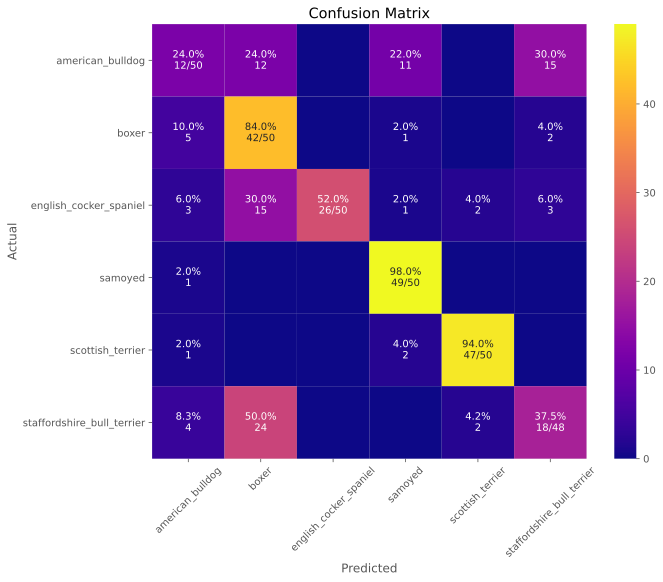

In [90]:
plot_cm(true, preds)

In [91]:
efficientnet_model.save_weights('ft_efficientnet_model')

In [93]:
import pandas as pd
df = pd.DataFrame()

In [98]:
images, labels = [], []
for batch, label in dataset_val:
    images.extend(batch.numpy())
    labels.extend(breeds[x] for x in label.numpy())

In [99]:
df['image'] = images
df['label'] = labels
df['pred'] = preds

In [102]:
samples = df[(df.label=='american_bulldog')&(df.pred=='samoyed')]['image'].values

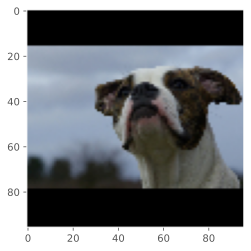

In [118]:
plt.imshow(samples[9]/255.)
plt.grid(None)